In [1]:
%load_ext autoreload
%autoreload 2
from awesome.run.awesome_config import AwesomeConfig
from awesome.run.awesome_runner import AwesomeRunner
from awesome.util.reflection import class_name
from awesome.analytics.result_model import ResultModel
from awesome.util.path_tools import get_project_root_path, get_package_root_path
import os
import torch
import re
import numpy as np
from awesome.util.format import latex_postprocessor
import numpy as np
from awesome.agent.torch_agent_checkpoint import TorchAgentCheckpoint
from awesome.agent.util.tracker import Tracker
from awesome.measures.miou import MIOU
from awesome.measures.pixel_accuracy import PixelAccuracy
import awesome.run.functions as f
from awesome.util.temporary_property import TemporaryProperty
import matplotlib.pyplot as plt
from matplotlib.colors import to_hex, to_rgb, to_rgba
from tqdm.auto import tqdm
from awesome.model.convex_net import ConvexNextNet
from awesome.run.functions import plot_as_image
import cv2 as cv

os.chdir(get_project_root_path()) # Beeing in the root directory of the project is important for the relative paths to work consistently

## Declaring Functions

In [3]:
import awesome.run.functions as f
from awesome.util.torch import VEC_TYPE
from typing import Optional

def query_sam(image: VEC_TYPE, point_coords: np.ndarray, point_labels:np.ndarray, checkpoint_path: Optional[str] = None) -> torch.Tensor:
    if checkpoint_path is None:
        checkpoint_path = "./data/checkpoints/sam/sam_vit_h_4b8939.pth"
    image = image.detach().cpu().permute(1, 2, 0).numpy() if not isinstance(image, np.ndarray) else image
    if image.dtype != np.uint8:
        image = (image * 255.).astype(np.uint8)

    from segment_anything import SamPredictor, sam_model_registry, SamAutomaticMaskGenerator
    
    sam = sam_model_registry["default"](checkpoint=checkpoint_path)
    sam.eval()
    try:
        sam.to(torch.device("cuda"))
        predictor = SamPredictor(sam)
        predictor.set_image(image)
        with torch.no_grad():
            masks, quality, logits = predictor.predict(point_coords, point_labels)
    finally:
        sam.to(torch.device("cpu"))
        del sam
    return masks, quality, logits


@f.saveable()
def plot_sam_prompt(image, mask, coords, labels, 
                    tight=True, 
                    size=5, 
                    markersize: float= 10, 
                    darkening_background: float=0.7, 
                    lined_contours: bool = True,
                    filled_contours: bool = False,
                    crop_coords=None,
                    mask_alpha: float = 1.):
    from matplotlib.colors import to_hex, to_rgba
    tab10_blue = to_hex(plt.get_cmap("tab10")(0))
    tab10_orange = to_hex(plt.get_cmap("tab10")(1))
    tab10_green = to_hex(plt.get_cmap("tab10")(2))
    tab10_red = to_hex(plt.get_cmap("tab10")(3))
    if crop_coords is not None:
        image = image[:, crop_coords[1][0]:crop_coords[1][1], crop_coords[0][0]:crop_coords[0][1]]
        mask = mask[crop_coords[1][0]:crop_coords[1][1], crop_coords[0][0]:crop_coords[0][1]]
        coords = coords - crop_coords[:, 0]

    mask_color = tab10_blue
    rgba_mask_color = to_rgba(mask_color)
    rgba_mask_color = rgba_mask_color[:3] + (mask_alpha,)
    fig = f.plot_mask(image, mask, color=rgba_mask_color, tight=tight, size=size, 
            contour_linewidths=4, lined_contours=lined_contours, filled_contours= filled_contours,
            darkening_background=darkening_background)
    ax = fig.axes[0]
    dot_colors = np.array([to_rgba(tab10_green) if l == 1 else to_rgba(tab10_red) for l in labels])
    if np.multiply(*coords.shape) > 0:
        ax.scatter(coords[:, 0], coords[:, 1], color=dot_colors, s=markersize, zorder=10)
    return fig

@f.saveable()
def plot_sam_prompt_prior(image, mask, prior, coords, labels, tight=True, size=5, markersize:float=10, darkening_background:float = 0.7, crop_coords=None):
    tab10_blue = to_hex(plt.get_cmap("tab10")(0))
    tab10_orange = to_hex(plt.get_cmap("tab10")(1))
    tab10_green = to_hex(plt.get_cmap("tab10")(2))
    tab10_red = to_hex(plt.get_cmap("tab10")(3))

    if crop_coords is not None:
        image = image[:, crop_coords[1][0]:crop_coords[1][1], crop_coords[0][0]:crop_coords[0][1]]
        mask = mask[crop_coords[1][0]:crop_coords[1][1], crop_coords[0][0]:crop_coords[0][1]]
        prior = prior[crop_coords[1][0]:crop_coords[1][1], crop_coords[0][0]:crop_coords[0][1]]
        coords = coords - crop_coords[:, 0]

    stacked_mask = np.stack([mask, prior], axis=-1)
    fig = f.plot_mask(image, stacked_mask, color=[tab10_blue, tab10_orange], tight=tight, size=size, contour_linewidths=4, darkening_background=darkening_background)
    ax = fig.axes[0]
    dot_colors = np.array([to_rgba(tab10_green) if l == 1 else to_rgba(tab10_red) for l in labels])
    ax.scatter(coords[:, 0], coords[:, 1], color=dot_colors, s=markersize, zorder=10)
    return fig

tab10_blue = to_hex(plt.get_cmap("tab10")(0))
tab10_orange = to_hex(plt.get_cmap("tab10")(1))
tab10_red = to_hex(plt.get_cmap("tab10")(3))
tab10_green = to_hex(plt.get_cmap("tab10")(2))
tab10_purple = to_hex(plt.get_cmap("tab10")(4))

@f.saveable()
def plot_scribbles(image, fg, bg, tight: bool =False, size: float=5):
    fig = plt.figure(figsize=(size, size))
    fig = None
    ax = None
    if tight:
        sizes = np.shape(image)[1:]  
        fig = plt.figure(figsize=(size, size))
        dpi = 300
        fig.set_size_inches(size * (sizes[1] / dpi), size * (sizes[0] / dpi), forward = False)
        ax = plt.Axes(fig, [0., 0., 1., 1.])
        ax.set_axis_off()
        fig.add_axes(ax)
    else:
        fig, ax = plt.subplots(1, 1, figsize=(size, size))

    ax.imshow(image.permute(1, 2, 0))

    #ax.pcolormesh(subsampled_image, edgecolors="#a2a6ab", linewidth=.5, facecolors='none',rasterized=True, zorder=0)

    fg_pred_color = np.zeros(fg.shape + (4,), dtype=np.float32)

    fg_pred_color[..., 0:3] = to_rgb(tab10_green)
    alpha_fg_scribble = 1
    fg_pred_color[..., 3] = fg * alpha_fg_scribble

    ax.imshow(fg_pred_color)

    bg_pred_color = np.zeros(bg.shape + (4,), dtype=np.float32)

    bg_pred_color[..., 0:3] = to_rgb("#0000ff")
    alpha_bg_scribble = 1
    bg_pred_color[..., 3] = bg * alpha_bg_scribble

    ax.imshow(bg_pred_color)
    return fig

## Extracting trained models and Results for plotting

In [ ]:
from awesome.analytics.result_comparison import ResultComparison

paths = ['./runs/unireps/joint','./runs/unireps/individual' ]
models = []

for path in paths:
    for folder in os.listdir(path):
        model = ResultModel.from_path(os.path.join(path, folder))
        models.append(model)

import re
p = r"#?(?P<cfg_num>\d+)?_?(?P<net>\w+)_benchmark(?P<feat>(\+\w+)*)\_(?P<date>\d{2}_\d{2}_\d{2})\_(?P<time>\d{2}_\d{2}_\d{2})"
pattern = re.compile(p)

for model in models:
    match = pattern.match(model.name)
    model_name = None
    feat = []
    if match:
        model_name = match.group('net')
        features = match.group('feat')
        if features is not None and features != "":
            feat = features.strip("+").split("+")
            if not any(["seed" in x for x in feat]):
                feat.append("seed42")
            feat = sorted(feat)
    else:
        print('No match for', model.name)
    model_name = model_name.replace("NET", "Net")
    model.display_name = model_name + " " + " ".join(feat)
    model.config.result_directory = "final_mask"
    model.save_config()


# Resort the models by name to get a meaningful table order

_order = []

models = sorted(models, key=lambda m: _order.index(m.name) if m.name in _order else 0)

comparison = ResultComparison(models)
comparison.assign_numbers(force=True)

os.environ['PLOT_OUTPUT_DIR'] = comparison.output_folder

save_args = dict(transparent=False, save=True, dpi=300, ext=["png", "pdf"])


In [ ]:
from typing import Any, Dict
import pandas as pd
model_names = set([m.config.name.split(" ")[0] for m in models])
features = set([y for m in models for y in m.config.name.split(" ")[1:]])
seeds = {x for x in features if "seed" in x}
features = features - seeds - {"convex", "joint"}
model_names, features, seeds

columns = list(features) + ['joint ' + x for x in features]
columns = columns + [x + " seeds" for x in columns]

rows = list(model_names)

df = pd.DataFrame(index=rows, columns=columns)
df[pd.isna(df)] = 0

for c in [x for x in df.columns if "seeds" in x]:
    df.loc[:, c] = ""

def extract_features(model: ResultModel) -> Dict[str, Any]:
    res = dict()
    
    res['joint'] = "joint" in model.config.name
    
    res['model_name'] = model.config.name.split(" ")[0]
    model_features = model.config.name.split(" ")[1:]
    
    if res['joint']:
        model_features.remove("joint")
    
    seed = [x for x in model_features if "seed" in x][0]
    model_features.remove(seed)

    res['seed'] = int(seed.replace("seed", ""))

    if "convex" in model_features:
        model_features.remove("convex")
        res['convex'] = True
    else:
        res['convex'] = False

    assert len(model_features) == 1, f"Multiple features {model_features} in model {model.output_folder}"
    res['feature_type'] = model_features[0]

    return res


for model in models:
    res = extract_features(model)

    is_joint = res['joint']
    model_name =  res['model_name']
    model_features = model.config.name.split(" ")[1:]
    
    feat_type = "joint " + res['feature_type'] if is_joint else res['feature_type']   
    df.loc[model_name, feat_type] += 1
    seed_col = feat_type + " seeds"
    df.loc[model_name, seed_col] = str(df.loc[model_name, seed_col]) + " " + str(res['seed'])
    

df

In [ ]:
from typing import Tuple
import pandas as pd

metrics = [
    "eval/epoch/MeanForegroundBinaryMIOU" ,
    "eval/epoch/MeanPixelAccuracy",
    "eval/epoch/MeanPriorPixelAccuracy",
    "eval/epoch/MeanPriorForegroundBinaryMIOU"
]

col_mapping = {
    "eval/epoch/MeanForegroundBinaryMIOU": "mIoU",
    "eval/epoch/MeanPixelAccuracy": "Acc.",
    "eval/epoch/MeanPriorPixelAccuracy" : "Convex Acc.",
    "eval/epoch/MeanPriorForegroundBinaryMIOU": "Convex mIoU"
}

df = comparison.metric_table(metrics, 
                             ref="last", 
                             mode="max",
                        formatting=False)

df = df.reset_index()

def extract_ft_row(row: pd.Series) -> Tuple[str, bool, str, int]:
    name = row['index']
    model = [m for m in models if m.name == name][0]
    res = extract_features(model)
    return (res['model_name'], res['joint'], res['feature_type'], res['seed'])


df[['model_name', 'joint', 'feature_type', 'seed']] = df.apply(extract_ft_row, axis=1, result_type="expand")

grouped = df.groupby(['model_name', 'joint', 'feature_type'])

best_model_name = df.sort_values(by=['eval/epoch/MeanPriorForegroundBinaryMIOU'], ascending=False).iloc[1]["index"]

model_names = [best_model_name]

display(df)
print(best_model_name)

In [ ]:


miou = MIOU(invert=True)
acc = PixelAccuracy()

text = []

def to_text(*txt: str):
    if isinstance(txt, (list, tuple)):
        txt = "".join(txt)
    print(txt)
    text.append(txt)


plot_args = dict(save=True, size=5, tight=True, override=True, display=True, auto_close=True)

plot_models = [m for m in models if m.name in model_names] #[model] # models

for model in plot_models:
    model: ResultModel
    with TemporaryProperty(model, getitem_mask_mode="both"):
        runner = model.get_runner(-1)
        tracker: Tracker = model.get_tracker(-1)
        dataloader = runner.dataloader
        with TemporaryProperty(dataloader, dimension="3d"), plt.ioff():
            indices = [0, 8, 42]
            
            for image_idx in indices:
                image, ground_truth, _input, target, fg, bg, prior_state = f.prepare_input_eval(dataloader, None, image_idx)
                fg = fg.reshape(image.shape[1:])
                bg = bg.reshape(image.shape[1:])
                ground_truth = 1. - ground_truth
                predicted_mask, prior_mask = model[image_idx]

                model_name = model.name.replace(" ", "_")
                to_text("Model: " + model_name)
                to_text("Image: " + str(image_idx))

                #fig = plot_scribbles(image, bg, fg, tight=True, size=5)

                mask_stack = np.stack([bg, fg],axis=-1)

                # fig = f.plot_mask(image, prior_mask, path=f"notebooks/rebuttal/prior_{model_name}_{image_idx}.png", 
                # color=tab10_orange, tight=True, size=5, darkening_background=0, contour_linewidths=4)
                # fig = f.plot_mask(None, mask_stack, path=f"notebooks/rebuttal/prior_{model_name}_{image_idx}.png", 
                # ax=fig.axes[0],
                # color=[to_rgba(tab10_red), to_rgba(tab10_green)], lined_contours=False, contour_linewidths=0, filled_contours=True,
                # **plot_args, darkening_background=0)

                contour_line_width = 2
                fig = f.plot_mask(image, ground_truth,
                color=tab10_purple, tight=True, size=5, darkening_background=0, lined_contours=False, filled_contours=True)
                fig = f.plot_mask(None, prior_mask, ax=fig.axes[0],
                color=tab10_orange, tight=True, size=5, darkening_background=0, contour_linewidths=contour_line_width)
                fig = f.plot_mask(None, mask_stack, path=f"notebooks/rebuttal/prior_{model_name}_{image_idx}_gt.png", 
                ax=fig.axes[0],
                color=[to_rgba(tab10_red), to_rgba(tab10_green)], lined_contours=False, contour_linewidths=0, filled_contours=True,
                **plot_args, darkening_background=0)

                display(fig)



## Plotting matlab comparison method

In [ ]:
from awesome.run.functions import plot_as_image
mat_path = "notebooks/rebuttal/results/mat"

import scipy.io
mat_files = [os.path.join(mat_path, x) for x in sorted(os.listdir(mat_path), key=lambda x: int(x.split(".")[0]))]   


In [ ]:
import cv2 as cv
from awesome.util.temporary_property import TemporaryProperty
import pandas as pd
from awesome.measures.miou import MIOU
from awesome.measures.pixel_accuracy import PixelAccuracy
from awesome.run.functions import plot_as_image

indices = [8, 42]
plot_args = dict(save=True, size=5, tight=True, override=True, display=True, auto_close=True)
for index in indices:
    loaded_mat = scipy.io.loadmat(mat_files[index])
    coords = loaded_mat["mConvexGeo_ConvexityShapedModel"].T

    with TemporaryProperty(dataloader, mode="sample"):
        _, sample = dataloader[index]
        img, gt, _input, target, fg, bg, prior_state = f.prepare_input_eval(dataloader, None, index)

        coords = np.round(coords).astype(int)
        mask = np.zeros(img.shape[1:])[..., None]

        cv.fillConvexPoly(mask, coords, color=1, lineType=cv.LINE_8)

        #mask[coords[:, 1], coords[:, 0]] = True

        mask_stack = np.stack([bg, fg],axis=-1)
        fig = f.plot_mask(img, mask, path=f"notebooks/rebuttal/matlab_{index}.png", 
        color=tab10_orange, tight=True, size=5, darkening_background=0, contour_linewidths=4)
        fig = f.plot_mask(None, mask_stack, path=f"notebooks/rebuttal/matlab_{index}.png", 
        ax=fig.axes[0],
        color=[to_rgba(tab10_green), to_rgba(tab10_red)], lined_contours=False, contour_linewidths=0, filled_contours=True,
        **plot_args, darkening_background=0)

## Failure cases of SAM

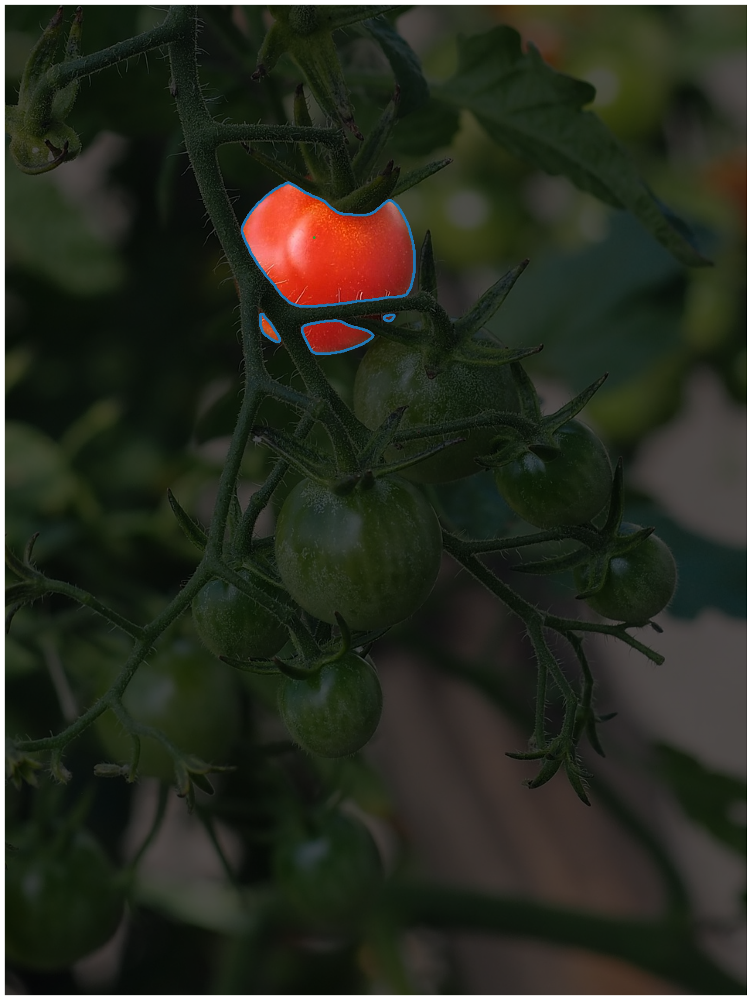

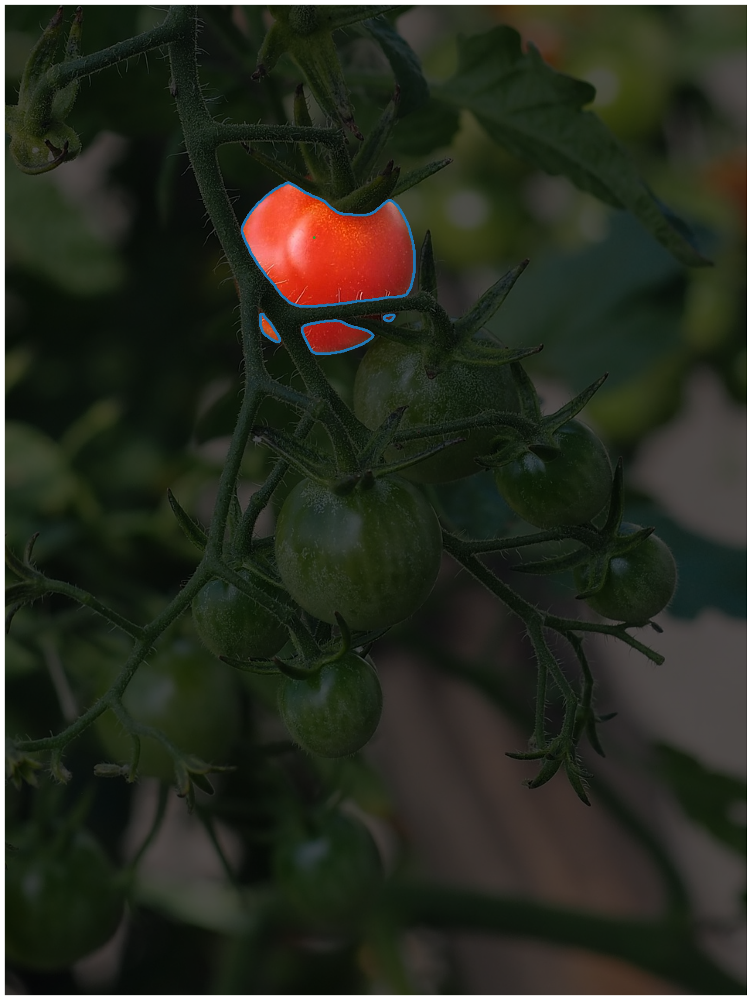

In [35]:


image_path = "notebooks/rebuttal/sam/cocktail-tomatoes-7461032_1280.jpg"
img = f.load_image(image_path)

coords = np.array([[  400,   300]])
labels = np.array([1])



sam_masks, quality, logits = query_sam(img, coords,labels)

plot_sam_prompt(img, sam_masks[0], coords, labels, tight=True, size=5, save=True, override=True, display=True, auto_close=True, path="notebooks/rebuttal/sam_tomato.png")

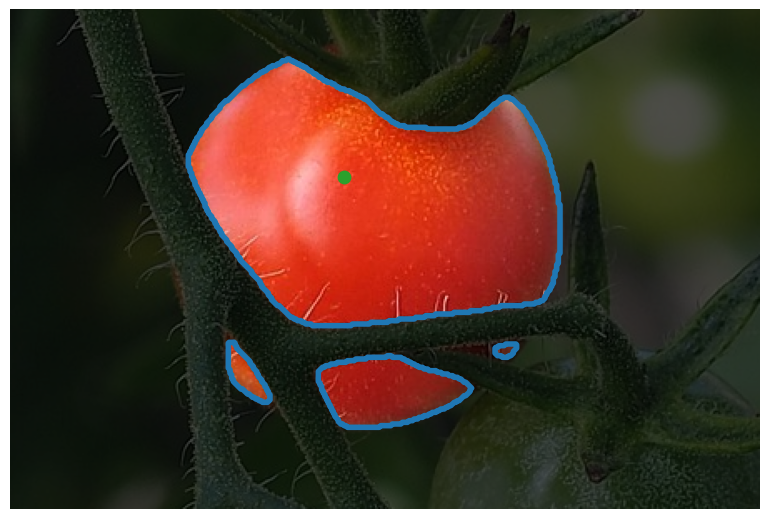

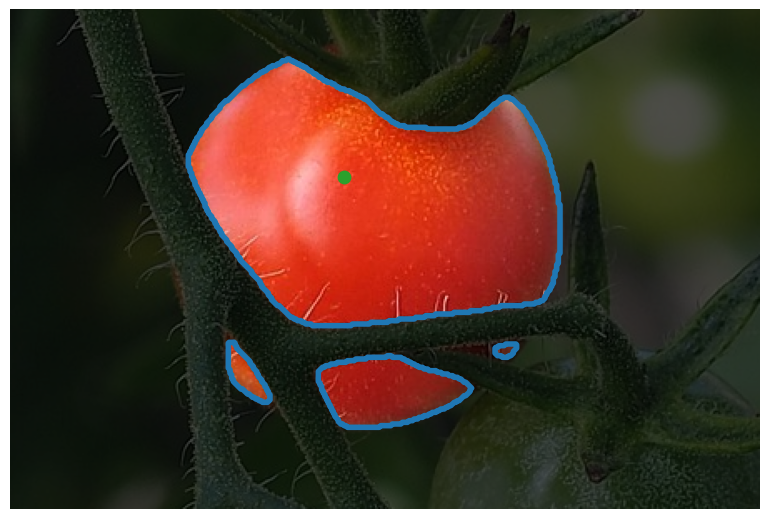

In [36]:
crop_coords = np.array([[  200,   650], [  200,   500]])
plot_sam_prompt(img, sam_masks[0], coords, labels, crop_coords=crop_coords, 
                markersize=80,
                tight=True, size=5, save=True, override=True, display=True, auto_close=True, path="notebooks/rebuttal/sam_tomato_crop.png")

## Declare functions for easier projection

In [24]:
def learn_convex_net(
                    model: ConvexNextNet,
                    x: torch.Tensor, 
                    unaries: torch.Tensor,
                    lr: float = 1e-3,
                    weight_decay: float = 0,
                    max_iter: int = 1000,
                    device: Optional[torch.device] = None,
                    use_progress_bar: bool = True,
                ) -> torch.Tensor:
    from awesome.measures.se import SE
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    if len(unaries.shape) != 4:
        unaries = unaries.unsqueeze(0)

    if len(x.shape) != 4:
        x = x.unsqueeze(0)
    y = unaries

    criterion = SE()

    old_device = next(model.parameters()).device
    loss_hist = torch.zeros(max_iter)
    torch.fill(loss_hist, torch.nan)

    is_training = model.training
    if old_device != device:
        model.to(device)
        x = x.to(device)
        y = y.to(device)
        loss_hist = loss_hist.to(device)
    
    try:
        model.train()
        optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

        it = range(max_iter) 
        if use_progress_bar:
            it = tqdm(it, total=max_iter, desc="Learning convex net", delay=5)
        
        for i in it:
            optimizer.zero_grad()
            y_pred = torch.sigmoid(model(x))
            loss = criterion(y_pred, y)

            if ~(torch.isnan(loss) | torch.isinf(loss)):
                loss.backward()
                optimizer.step()
                model.enforce_convexity()
            else:
                raise ValueError("Loss is nan or inf!")
            
            loss_hist[i] = loss.detach()

            if use_progress_bar:
                it.set_postfix({"loss": "{:.3e}".format(loss.item())})

    finally:
        # Restore old device
        if old_device != device:
            model.to(old_device)
            x = x.to(old_device)
            y = y.to(old_device)
            loss_hist = loss_hist.to(old_device)

        model.train(is_training)
    return loss_hist 

def project_convex(unaries: torch.Tensor):
    y = unaries.squeeze()
    xx = torch.arange(0, y.shape[1], dtype=torch.float32)
    yy = torch.arange(0, y.shape[0], dtype=torch.float32)
    yy, xx = torch.meshgrid(yy, xx)
    x = torch.stack([yy, xx], dim=-1).unsqueeze(0).permute(0, 3, 1, 2)

    from awesome.transforms.min_max import MinMax
    minmax = MinMax(new_min=0, new_max=1, dim=(-2, -1))
    x_norm=minmax.fit_transform(x[0])
    model = ConvexNextNet()
    loss = learn_convex_net(model, x_norm, 1 - torch.from_numpy(y).unsqueeze(0).float(), lr=1e-3, max_iter=4000, weight_decay=0, use_progress_bar=True)
    with torch.no_grad():
        pred = torch.sigmoid(model(x_norm.unsqueeze(0)))[0] <= 0.5
    return pred, model

In [25]:

y = sam_masks[0]
xx = torch.arange(0, y.shape[1], dtype=torch.float32)
yy = torch.arange(0, y.shape[0], dtype=torch.float32)
yy, xx = torch.meshgrid(yy, xx)
x = torch.stack([yy, xx], dim=-1).unsqueeze(0).permute(0, 3, 1, 2)

from awesome.transforms.min_max import MinMax
minmax = MinMax(new_min=0, new_max=1, dim=(-2, -1))
x_norm=minmax.fit_transform(x[0])

model = ConvexNextNet()
loss = learn_convex_net(model, x_norm, 1 - torch.from_numpy(y).unsqueeze(0).float(), lr=1e-3, max_iter=4000, weight_decay=0, use_progress_bar=True)

with torch.no_grad():
    prior = torch.sigmoid(model(x_norm.unsqueeze(0)))[0] <= 0.5


Learning convex net:   0%|          | 0/4000 [00:00<?, ?it/s, loss=4.215e-01]

## Declare functions for convex hull

In [26]:
from scipy.spatial import ConvexHull
def extract_contour_points(mask: np.ndarray, min_size: int = 0):
    img_mask = (mask * 255).astype(np.uint8)
    contours, _ = cv.findContours(img_mask, mode=cv.RETR_TREE, method=cv.CHAIN_APPROX_NONE)
    if min_size != 0:
        filtered_contours = []
        for c in contours:
            area = cv.contourArea(c)
            if area >= min_size:
                filtered_contours.append(c)
        contours = filtered_contours
    
    
    indev_length = np.array([len(x) for x in contours])
    ends = np.cumsum(indev_length)
    combined = np.concatenate(contours, axis=0)[:, 0, :]

    is_filled = np.zeros((len(ends)), dtype=np.bool_)
    for i, c in enumerate(contours):
        m = np.zeros(img_mask.shape)
        cv.fillConvexPoly(m, c, color=255, lineType=cv.LINE_8)
        # Contour points are part of the mask 1 mask so ignore them to determine wether it is a filled shape
        # Only covers holes in masks, if hole itself has a contour, it will also return filled
        m[c[:, 0, 1], c[:, 0, 0]] = False
        is_filled[i] = mask[m == 255].any()
    return combined, ends, is_filled 

combined, ends, is_filled = extract_contour_points(y, min_size=0)

def contours_to_edges(contour_points, ends, mask_shape):
    import matplotlib.pyplot as plt
    msks = np.zeros((*mask_shape, len(ends)))
    for i, end in enumerate(ends):
        start = 0
        if i > 0:
            start = ends[i-1]
        pts = contour_points[start: end]
        msks[pts[:, 1], pts[:, 0], i] = True 
    return msks

contour_edges = contours_to_edges(combined, ends, y.shape[:2])

c_hull = ConvexHull(combined)

cv_points = np.stack([combined[c_hull.vertices,0], combined[c_hull.vertices,1]])
convex_hull_mask = np.zeros(y.shape[:2])
cv.fillConvexPoly(convex_hull_mask, cv_points.T, color=255, lineType=cv.LINE_8)


array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

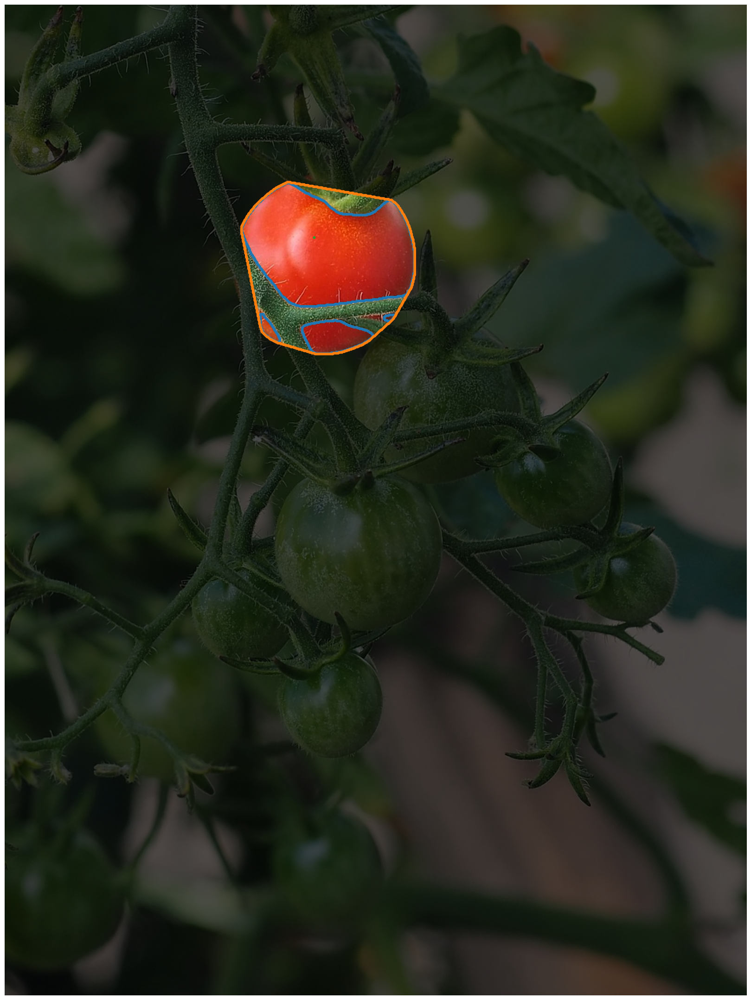

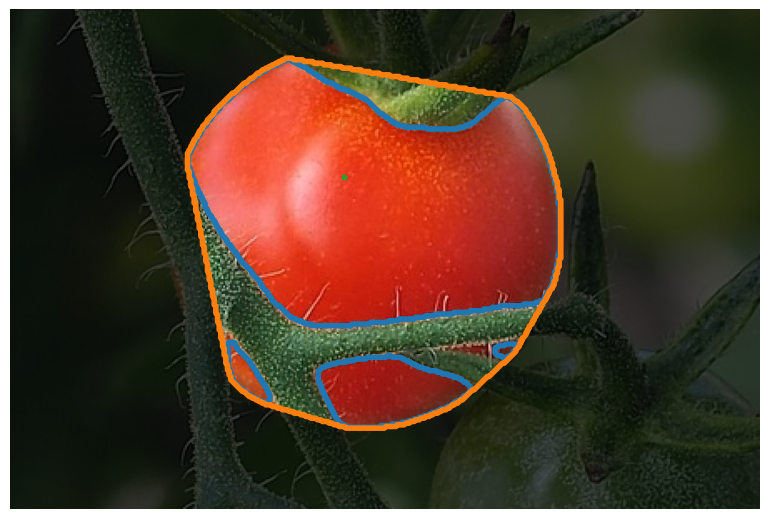

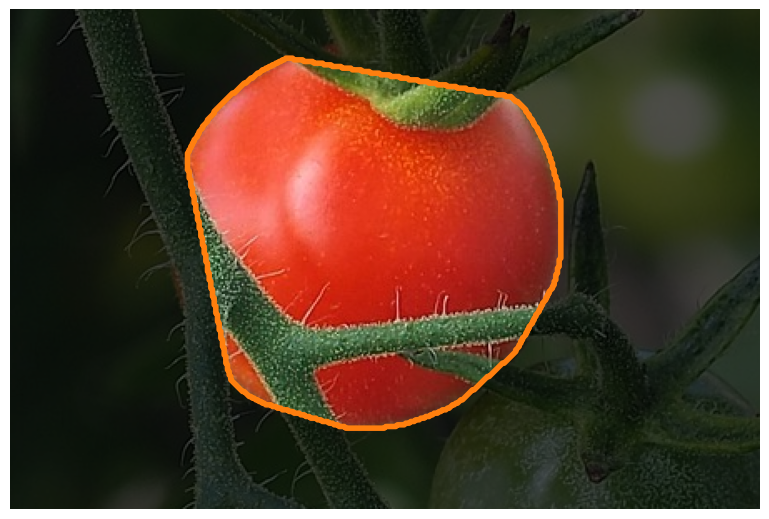

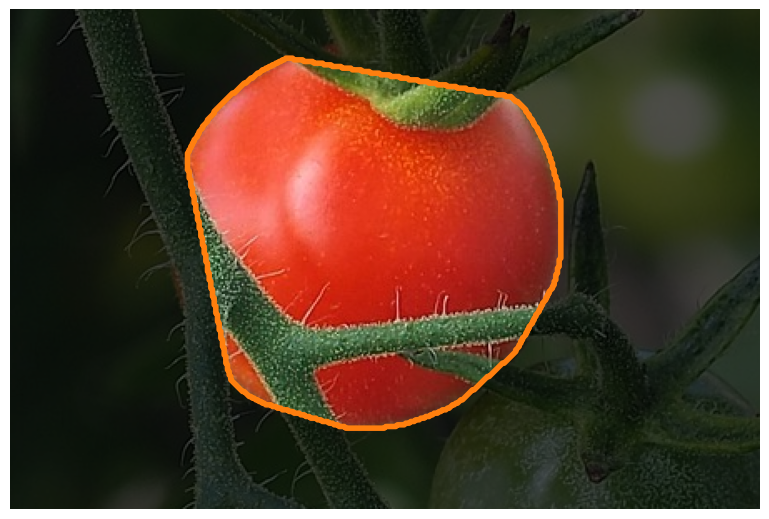

In [27]:
from awesome.run.functions import plot_mask
plot_sam_prompt_prior(img, sam_masks[0], convex_hull_mask, coords, labels, save=True, tight=True, size=5, override=True, display=True, auto_close=True, path="notebooks/rebuttal/sam_tomato_convex_hull.png")
plot_sam_prompt_prior(img, sam_masks[0], convex_hull_mask, coords, labels, crop_coords=crop_coords, save=True, tight=True, size=5, override=True, display=True, auto_close=True, path="notebooks/rebuttal/sam_tomato_convex_hull_crop_wsam.png")


cimg = img[:, crop_coords[1][0]:crop_coords[1][1], crop_coords[0][0]:crop_coords[0][1]]
cprior = convex_hull_mask[crop_coords[1][0]:crop_coords[1][1], crop_coords[0][0]:crop_coords[0][1]]

plot_mask(cimg, cprior, color=tab10_orange, tight=True, size=5, save=True, contour_linewidths=4, path="notebooks/rebuttal/sam_tomato_convex_hull_crop.png", override=True, display=True, auto_close=True)

## SAM in Slightly corrupted Image Setting

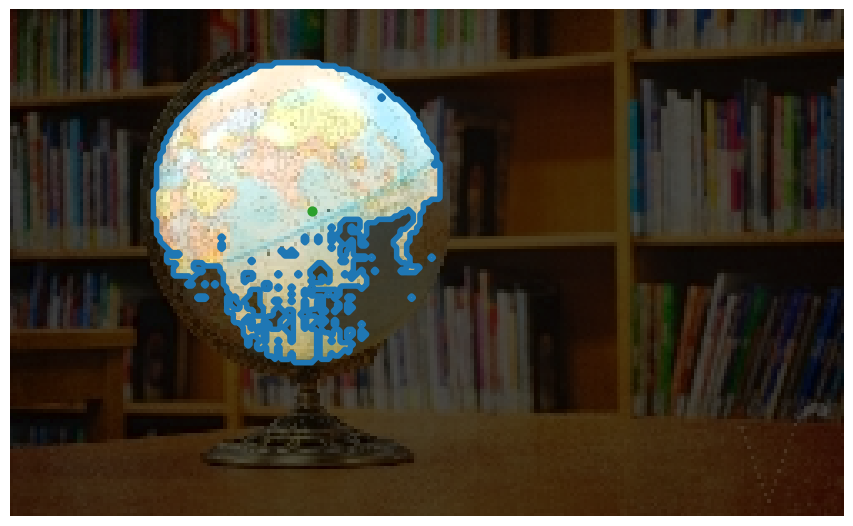

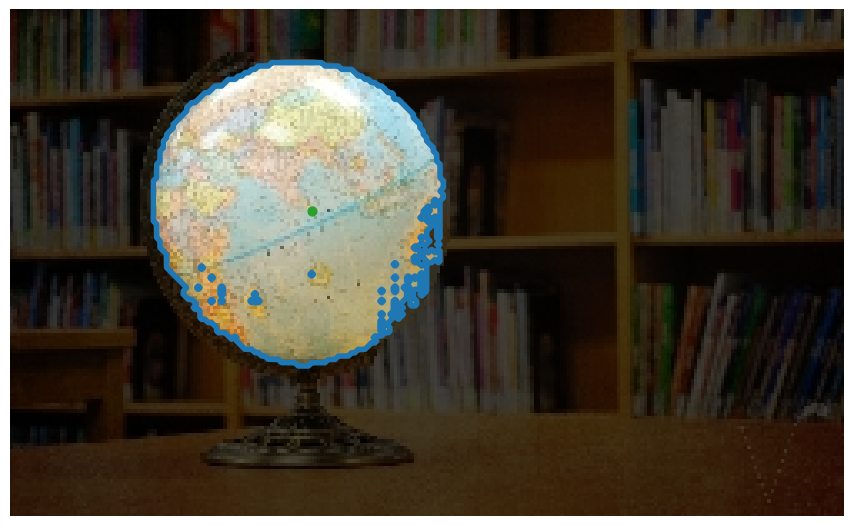

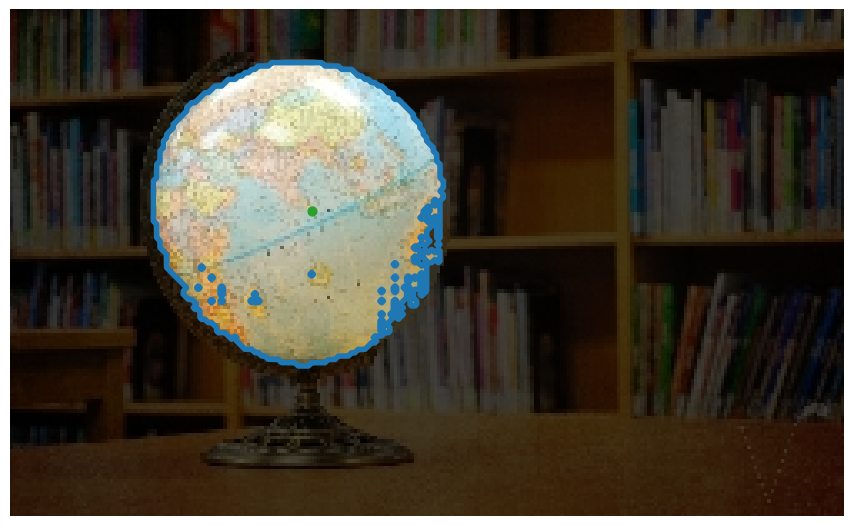

In [29]:
from awesome.dataset.convexity_segmentation_dataset import ConvexitySegmentationDataset, OutputMode
from awesome.util.corruptions import gaussian_noise, spatter, impulse_noise, speckle_noise, contrast, brightness

dataset = ConvexitySegmentationDataset("./data/datasets/convexity_dataset")
dataset.output_mode = OutputMode.IMAGE

index = 0
severity = 1

image, label = dataset[index]
np_img = (image[0].permute(1, 2, 0).numpy() * 255).round().astype(np.uint8)
currupted_img = brightness(np_img, severity) / 255


point_coords = np.array([[  90,   60]])
radius = 1
x = np.arange(0, currupted_img.shape[1])
y = np.arange(0, currupted_img.shape[0])
xx, yy = np.meshgrid(x, y)
distance = np.sqrt((xx - point_coords[0, 0])**2 + (yy - point_coords[0, 1])**2) < (radius / 2)
point_coords = np.argwhere(distance)[:, ::-1]

point_labels = np.ones((point_coords.shape[0],))

sam_masks, quality, logits = query_sam(currupted_img, point_coords,point_labels)
sam_masks_clean, _, _ = query_sam(image[0], point_coords,point_labels)

plot_sam_prompt(currupted_img, sam_masks[0], point_coords, point_labels, tight=True, size=10, display=True, darkening_background=0.7, markersize=40)
plot_sam_prompt(image[0], sam_masks_clean[0], point_coords, point_labels, tight=True, size=10, display=True, darkening_background=0.7, markersize=40)

## Project currupted SAM plots to convex shape

In [31]:

pclean, mclean = project_convex(sam_masks_clean[0])
pcurr, mcurr = project_convex(sam_masks[0])
    

Learning convex net:   0%|          | 0/4000 [00:00<?, ?it/s, loss=2.807e-01]

Learning convex net:   0%|          | 0/4000 [00:00<?, ?it/s, loss=3.229e-01]

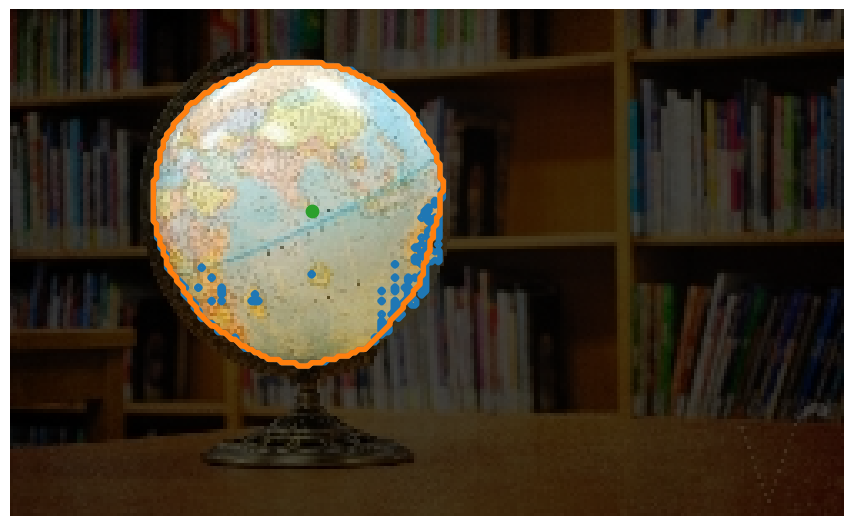

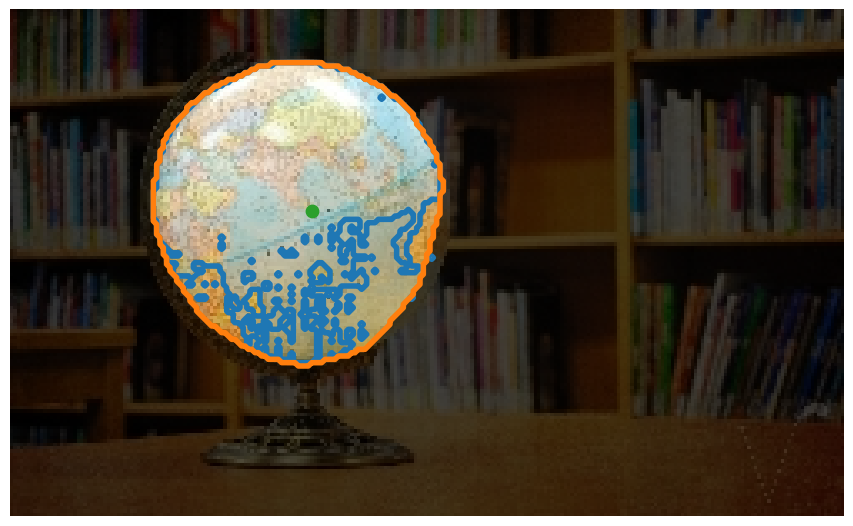

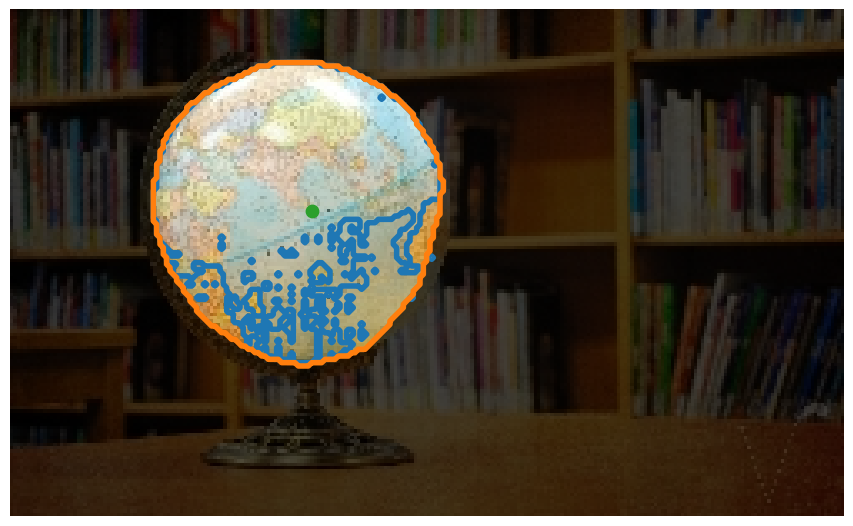

In [33]:
plot_sam_prompt_prior(image[0], sam_masks_clean[0], pclean[0], point_coords, point_labels, tight=True, size=10, display=True, darkening_background=0.7, markersize=80, save=True, override=True, path="notebooks/rebuttal/sam_clean_globe_new.png")
plot_sam_prompt_prior(image[0], sam_masks[0], pclean[0], point_coords, point_labels, tight=True, size=10, display=True, darkening_background=0.7, markersize=80, save=True, override=True, path="notebooks/rebuttal/sam_corrupted_brightness_sev_1_globe_new.png")

In [ ]:
pclean.shape

In [ ]:
plot_as_image(pclean, cmap="grey")

In [ ]:
y = sam_masks_clean[0].squeeze()
xx = torch.arange(0, y.shape[1], dtype=torch.float32)
yy = torch.arange(0, y.shape[0], dtype=torch.float32)
yy, xx = torch.meshgrid(yy, xx)
x = torch.stack([yy, xx], dim=-1).unsqueeze(0).permute(0, 3, 1, 2)

from awesome.transforms.min_max import MinMax
minmax = MinMax(new_min=0, new_max=1, dim=(-2, -1))
x_norm=minmax.fit_transform(x[0])

In [ ]:
plot_sam_prompt(currupted_img, sam_masks[0], point_coords, point_labels, tight=True, size=10, display=True, darkening_background=0)

In [ ]:
bad_df = df.sort_values(by=['eval/epoch/MeanForegroundBinaryMIOU'], ascending=True).iloc[0]
display(bad_df)
bad_model_name = bad_df["index"]


## OoD SAM prompts

In [ ]:
from awesome.dataset.sisbosi_dataset import SISBOSIDataset
import os
from awesome.dataset.convexity_segmentation_dataset import ConvexitySegmentationDataset, OutputMode
 
dataset = ConvexitySegmentationDataset("data/datasets/convexity_dataset")
dataset.output_mode = OutputMode.IMAGE
dataset.return_prior = False
img, fg, bg = dataset[0][0]

In [ ]:
fg_idx = torch.argwhere(fg)
fg_lab = torch.ones((fg_idx.shape[0], 1), dtype=torch.float32)
fg_idx

In [ ]:
point_coords = fg_idx.numpy()[:, ::-1]
point_labels = fg_lab.numpy().squeeze()

sam_masks, quality, logits = query_sam(img, point_coords, point_labels)
plot_sam_prompt(img, sam_masks[quality.argmax()], point_coords, point_labels, 
    tight=True, size=5, markersize=1, 
    display=True, darkening_background=0.0, 
    filled_contours=True, lined_contours=False,
    override=True,
    save=True, path="notebooks/rebuttal/sam_ood_fg.png"
    )
plot_sam_prompt(img, sam_masks[quality.argmax()], np.array([[]]), np.array([]), 
    tight=True, size=5, markersize=1, 
    display=True, darkening_background=0.0, 
    filled_contours=True, lined_contours=False,
    override=True,
    mask_alpha=0.7,
    save=True, path="notebooks/rebuttal/sam_ood_fg_no_lab.png"
    )

In [ ]:
point_coords = fg_idx.numpy()[:, ::-1]
point_labels = fg_lab.numpy().squeeze()
bg_point_coords = torch.argwhere(bg).numpy()[:, ::-1]
bg_point_labels = np.zeros((len(bg_point_coords),), dtype=np.int32)
# Stack with BG
point_coords = np.concatenate([point_coords, torch.argwhere(bg).numpy()[:, ::-1]], axis=0)
point_labels = np.concatenate([point_labels, bg_point_labels])
sam_masks, quality, logits = query_sam(img, point_coords, point_labels)

plot_sam_prompt(img, sam_masks[quality.argmax()], point_coords, point_labels, tight=True, 
markersize=1, size=5, display=True, darkening_background=0, filled_contours=True, lined_contours=False, override=True,
mask_alpha=0.7,
save=True, path="notebooks/rebuttal/sam_ood_fgbg.png"
)

plot_sam_prompt(img, sam_masks[quality.argmax()], np.array([[]]), np.array([]), tight=True, 
markersize=1, size=5, display=True, darkening_background=0, filled_contours=True, lined_contours=False, override=True,
mask_alpha=0.7,
save=True, path="notebooks/rebuttal/sam_ood_fgbg_no_lab.png"
)

## SIREN Network as Regularizer

| FCNet | SIREN | Convex |
| ------ | ----- | ----- |
| 0.629 | 0.573 | 0.898 |

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from typing import Optional
from tqdm.auto import tqdm
from awesome.util.pixelize import pixelize
from awesome.run.functions import plot_as_image
import awesome.run.functions as f
d_features = 20
factor = 30
d_hidden = 350

class SirenNetwork(nn.Module):
    def __init__(self, d_in=2, d_features=20, d_hidden=350, d_out=1, factor=30):
        super().__init__()
        
        self.register_buffer("A", torch.tensor(factor*torch.randn(d_in, d_features), requires_grad=False))
        self.register_buffer("b", torch.tensor(torch.randn(d_features), requires_grad=False))

        self.fc1 = nn.Linear(d_features, d_hidden)
        self.fc2 = nn.Linear(d_hidden, d_hidden)
        self.fc3 = nn.Linear(d_hidden, d_out)
    
    @pixelize()
    def forward(self,x):
        #x = torch.cat((torch.sin(x@self.A +self.b),torch.cos(x@self.A+self.b)),1)
        x = torch.cos(x@self.A+self.b)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))
        x = torch.sigmoid(x)
        return x

def learn_siren_net(
                    model,
                    x: torch.Tensor, 
                    unaries: torch.Tensor,
                    lr: float = 1e-3,
                    weight_decay: float = 0,
                    max_iter: int = 1000,
                    device: Optional[torch.device] = None,
                    use_progress_bar: bool = True,
                ) -> torch.Tensor:
    from awesome.measures.se import SE
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    if len(unaries.shape) != 4:
        unaries = unaries.unsqueeze(0)

    if len(x.shape) != 4:
        x = x.unsqueeze(0)
    y = unaries

    criterion = SE()

    old_device = next(model.parameters()).device
    loss_hist = torch.zeros(max_iter)
    torch.fill(loss_hist, torch.nan)

    is_training = model.training
    if old_device != device:
        model.to(device)
        x = x.to(device)
        y = y.to(device)
        loss_hist = loss_hist.to(device)
    
    try:
        model.train()
        optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

        it = range(max_iter) 
        if use_progress_bar:
            it = tqdm(it, total=max_iter, desc="Learning convex net", delay=5)
        
        for i in it:
            optimizer.zero_grad()
            y_pred = torch.sigmoid(model(x))
            loss = criterion(y_pred, y)

            if ~(torch.isnan(loss) | torch.isinf(loss)):
                loss.backward()
                optimizer.step()
                #model.enforce_convexity()
            else:
                raise ValueError("Loss is nan or inf!")
            
            loss_hist[i] = loss.detach()

            if use_progress_bar:
                it.set_postfix({"loss": "{:.3e}".format(loss.item())})

    finally:
        # Restore old device
        if old_device != device:
            model.to(old_device)
            x = x.to(old_device)
            y = y.to(old_device)
            loss_hist = loss_hist.to(old_device)

        model.train(is_training)
    return loss_hist 

def project_siren(unaries: torch.Tensor, d_features=20, d_hidden=350, factor=30):
    y = unaries.squeeze()
    xx = torch.arange(0, y.shape[1], dtype=torch.float32)
    yy = torch.arange(0, y.shape[0], dtype=torch.float32)
    yy, xx = torch.meshgrid(yy, xx)
    x = torch.stack([yy, xx], dim=-1).unsqueeze(0).permute(0, 3, 1, 2)

    from awesome.transforms.min_max import MinMax
    minmax = MinMax(new_min=0, new_max=1, dim=(-2, -1))
    x_norm=minmax.fit_transform(x[0])
   
    torch.manual_seed(0)
   
    model = SirenNetwork()
    loss = learn_siren_net(model, x_norm, 1 - torch.from_numpy(y).unsqueeze(0).float(), lr=1e-3, max_iter=4000, weight_decay=0, use_progress_bar=True)
    with torch.no_grad():
        raw = model(x_norm.unsqueeze(0))[0] 
        pred = raw <= 0.5
    return pred, model, raw


miou = MIOU(invert=False)
acc = PixelAccuracy()


bad_model = next((m for m in models if m.name in [bad_model_name])) #[model] # models


model: ResultModel = bad_model

unaries = []

text = []

def to_text(*txt: str):
    if isinstance(txt, (list, tuple)):
        txt = "".join(txt)
    print(txt)
    text.append(txt)

ious_siren = []
ious_segm = []

with TemporaryProperty(model, getitem_mask_mode="both"):
    runner = model.get_runner(-1)
    tracker: Tracker = model.get_tracker(-1)
    dataloader = runner.dataloader
    with TemporaryProperty(dataloader, dimension="3d"), plt.ioff():
        indices = list(range(len(dataloader)))
        
        for image_idx in indices:
            image, ground_truth, _input, target, fg, bg, prior_state = f.prepare_input_eval(dataloader, None, image_idx)
            fg = fg.reshape(image.shape[1:])
            bg = bg.reshape(image.shape[1:])
            ground_truth = 1. - ground_truth
            predicted_mask, prior_mask = model[image_idx]

            model_name = model.name.replace(" ", "_")
            to_text("Model: " + model_name)
            to_text("Image: " + str(image_idx))

            #fig = plot_scribbles(image, bg, fg, tight=True, size=5)

            mask_stack = np.stack([bg, fg],axis=-1)
            pred_stack = np.stack([predicted_mask, prior_mask],axis=-1)


            siren_pred, siren_model, siren_raw = project_siren(predicted_mask)
            iou_segmentation = miou(torch.tensor(predicted_mask).float(), ground_truth).item()
            ious_segm.append(iou_segmentation)

            to_text("Segmentation mIoU: " + str(iou_segmentation))
            
            iou_s = miou(siren_pred.float(), ground_truth).item()
            ious_siren.append(iou_s)  
            to_text("Siren mIoU: " + str(iou_s))

            fig = f.plot_mask(image, predicted_mask,path=f"notebooks/rebuttal/bad/segm_{model_name}_{image_idx}.png", **plot_args,
            color=to_rgba(tab10_blue), darkening_background=0, filled_contours=True, lined_contours=False)

            display(fig)


            fig = f.plot_mask(image, siren_pred, path=f"notebooks/rebuttal/bad/siren_{model_name}_{image_idx}.png", **plot_args,
            color=to_rgba(tab10_orange), darkening_background=0, filled_contours=True, lined_contours=False)

            
            # fig = f.plot_mask(image, ground_truth,
            # color=tab10_purple, tight=True, size=5, darkening_background=0, lined_contours=False, filled_contours=True)
            # fig = f.plot_mask(None, prior_mask, ax=fig.axes[0],
            # color=tab10_orange, tight=True, size=5, darkening_background=0, contour_linewidths=4)
            # fig = f.plot_mask(None, mask_stack, path=f"notebooks/rebuttal/bad/prior_{model_name}_{image_idx}_gt.png", 
            # ax=fig.axes[0],
            # color=[to_rgba(tab10_red), to_rgba(tab10_green)], lined_contours=False, contour_linewidths=0, filled_contours=True,
            # **plot_args, darkening_background=0)

            display(fig)

all_iou_siren = np.mean(ious_siren)
all_iou_segm = np.mean(ious_segm)

to_text("All Siren mIoU: " + str(ious_siren))
to_text("All Segmentation mIoU: " + str(ious_segm))

to_text("All Siren (Mean) mIoU: " + str(all_iou_siren))
to_text("All Segmentation (Mean) mIoU: " + str(all_iou_segm))


with open("notebooks/rebuttal/bad/results.txt", "w") as file:
    file.write("\n".join(text))

plot_as_image(siren_pred, cmap="grey")

In [ ]:

model = bad_model
with TemporaryProperty(model, getitem_mask_mode="both"):
    runner = model.get_runner(-1)
    tracker: Tracker = model.get_tracker(-1)
    dataloader = runner.dataloader
    with TemporaryProperty(dataloader, dimension="3d"), plt.ioff():
        indices = list(range(len(dataloader)))
        
        for image_idx in indices:
            image, ground_truth, _input, target, fg, bg, prior_state = f.prepare_input_eval(dataloader, None, image_idx)
            fg = fg.reshape(image.shape[1:])
            bg = bg.reshape(image.shape[1:])
            ground_truth = 1. - ground_truth
            predicted_mask, prior_mask = model[image_idx]

            model_name = model.name.replace(" ", "_")
            to_text("Model: " + model_name)
            to_text("Image: " + str(image_idx))

            #fig = plot_scribbles(image, bg, fg, tight=True, size=5)

            mask_stack = np.stack([bg, fg],axis=-1)

            # fig = f.plot_mask(image, prior_mask, path=f"notebooks/rebuttal/prior_{model_name}_{image_idx}.png", 
            # color=tab10_orange, tight=True, size=5, darkening_background=0, contour_linewidths=4)
            # fig = f.plot_mask(None, mask_stack, path=f"notebooks/rebuttal/prior_{model_name}_{image_idx}.png", 
            # ax=fig.axes[0],
            # color=[to_rgba(tab10_red), to_rgba(tab10_green)], lined_contours=False, contour_linewidths=0, filled_contours=True,
            # **plot_args, darkening_background=0)

            
            fig = f.plot_mask(image, mask_stack, path=f"notebooks/rebuttal/bad/scribble/scribble_{model_name}_{image_idx}.png", 
            color=[to_rgba(tab10_red), to_rgba(tab10_green)], lined_contours=False, contour_linewidths=0, filled_contours=True,
            **plot_args, darkening_background=0)

            fig = f.plot_mask(image, prior_mask, path=f"notebooks/rebuttal/bad/prior/prior_{model_name}_{image_idx}.png", **plot_args,
            color=to_rgba(tab10_orange), darkening_background=0, filled_contours=True, lined_contours=False)

            display(fig)
